<a href="https://colab.research.google.com/github/Bica-plus-equals/Environmental-Data-Analysis/blob/main/JenaCarboScope.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install cartopy
import cartopy

In [ ]:
!pip install xarray

import xarray as xr
import pandas as pd

from google.colab import drive
drive.mount('/content/drive')

ds = xr.open_dataset('/content/drive/MyDrive/r76nbetEXToc_v2024E.flux.nc')


In [ ]:
print(ds['year'])
print('*' *60)
print(ds.data_vars)
print(ds['co2flux_land'])

<xarray.DataArray 'year' (itime: 19724)> Size: 158kB
[19724 values with dtype=float64]
Coordinates:
  * itime    (itime) datetime64[ns] 158kB 1971-01-01 1971-01-02 ... 2024-12-31
Attributes:
    long_name:  internal time (as fractional year)
************************************************************
Data variables:
    lon_bounds     (lon, nv) float32 1kB ...
    lat_bounds     (lat, nv) float32 720B ...
    itime_bounds   (itime, nv) datetime64[ns] 316kB ...
    dt             (itime) timedelta64[ns] 158kB ...
    year           (itime) float64 158kB ...
    lproc          (proc) |S20 120B ...
    lrt            (rt) |S20 60B ...
    lspec          (spec) |S20 20B ...
    dxyp           (lat, lon) float32 52kB ...
    pland          (lat, lon) float32 52kB ...
    vegfrac        (lat, lon) float32 52kB ...
    po400          (lat, lon) float32 52kB ...
    po1km          (lat, lon) float32 52kB ...
    area           (rt, lat, lon) float32 156kB ...
    myear          (mtime) float6

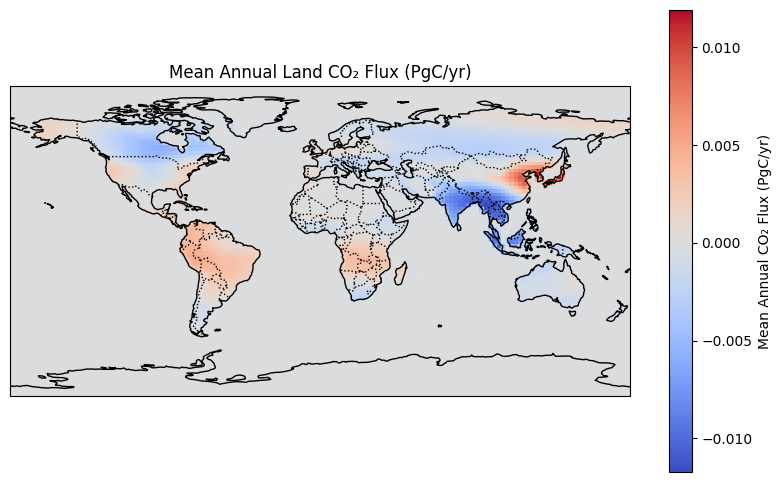

In [ ]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Coordinates
lat = ds['lat']
lon = ds['lon']

# Step 1: Compute annual mean using `myear` coordinate
# This assumes myear is aligned with mtime and can be used to group
annual_land = ds['co2flux_land'].groupby(ds['myear']).mean(dim='mtime')


# Step 2: Compute mean over all years
mean_annual_land = annual_land.mean(dim='myear')


# Step 3: Define plotting function
def plot_flux(data, title, cmap='coolwarm', vmin=None, vmax=None):
    fig, ax = plt.subplots(figsize=(10, 6), subplot_kw={'projection': ccrs.PlateCarree()})
    c = ax.pcolormesh(
        lon, lat, data,
        cmap=cmap,
        vmin=vmin,
        vmax=vmax,
        transform=ccrs.PlateCarree(),
        shading='auto'
    )

    ax.coastlines()
    ax.add_feature(cfeature.BORDERS, linestyle=':')
    ax.set_title(title)
    plt.colorbar(c, ax=ax, label='Mean Annual CO₂ Flux (PgC/yr)')
    plt.show()

# Step 4: Compute robust color scale (optional)
# vmin_land = float(np.nanpercentile(mean_annual_land, 2))
# vmax_land = float(np.nanpercentile(mean_annual_land, 98))


# Step 5: Plot
plot_flux(mean_annual_land, 'Mean Annual Land CO₂ Flux (PgC/yr)')



In [ ]:
print(ds['lrt'].values)

[b'land                ' b'ocean               ' b'all                 ']


/usr/local/lib/python3.11/dist-packages/cartopy/io/__init__.py:241: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/110m_physical/ne_110m_coastline.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)
/usr/local/lib/python3.11/dist-packages/cartopy/io/__init__.py:241: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/110m_cultural/ne_110m_admin_0_boundary_lines_land.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)


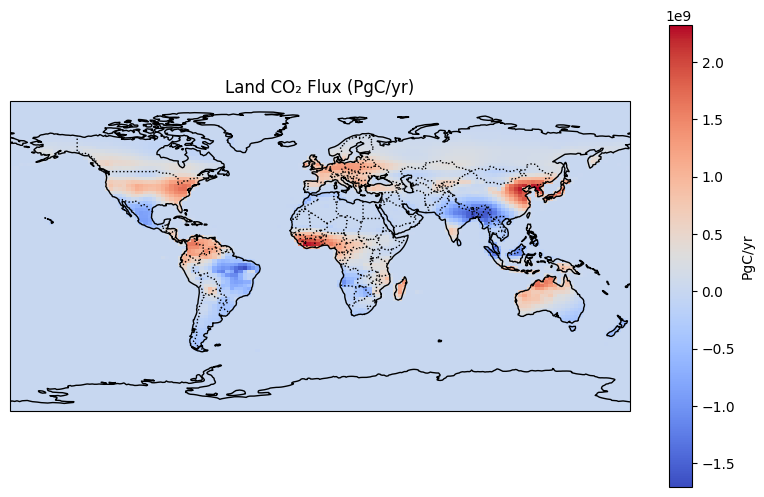

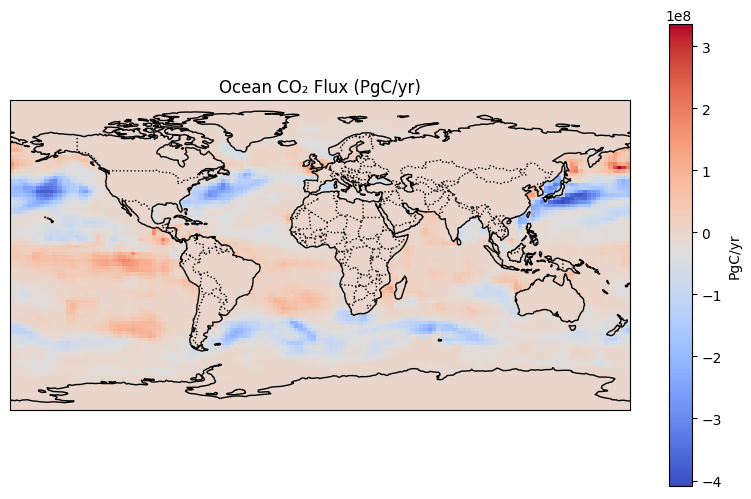

In [ ]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Load dataset
# ds = xr.open_dataset('your_dataset.nc')

# Select last time step
time_selected = ds['mtime'].values[-1]
co2flux_land = ds['co2flux_land'].sel(mtime=time_selected)
co2flux_ocean = ds['co2flux_ocean'].sel(mtime=time_selected)

# Multiply by dxyp to convert from PgC/m²/yr to PgC/yr
co2flux_land_pg_per_grid = co2flux_land * ds['dxyp']
co2flux_ocean_pg_per_grid = co2flux_ocean * ds['dxyp']

# Coordinates
lat = ds['lat']
lon = ds['lon']

# Define function for CO₂ flux plotting
def plot_flux(data, title, cmap='coolwarm'):
    fig, ax = plt.subplots(figsize=(10, 6), subplot_kw={'projection': ccrs.PlateCarree()})
    c = ax.pcolormesh(lon, lat, data, cmap=cmap, transform=ccrs.PlateCarree())

    # Add features
    ax.coastlines()
    ax.add_feature(cfeature.BORDERS, linestyle=':')
    ax.set_title(title)

    # Colorbar
    plt.colorbar(c, ax=ax, label='PgC/yr')
    plt.show()

# Plot with corrected units
plot_flux(co2flux_land_pg_per_grid, 'Land CO₂ Flux (PgC/yr)')
plot_flux(co2flux_ocean_pg_per_grid, 'Ocean CO₂ Flux (PgC/yr)')


/usr/local/lib/python3.11/dist-packages/cartopy/io/__init__.py:241: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/110m_physical/ne_110m_coastline.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)
/usr/local/lib/python3.11/dist-packages/cartopy/io/__init__.py:241: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/110m_cultural/ne_110m_admin_0_boundary_lines_land.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)


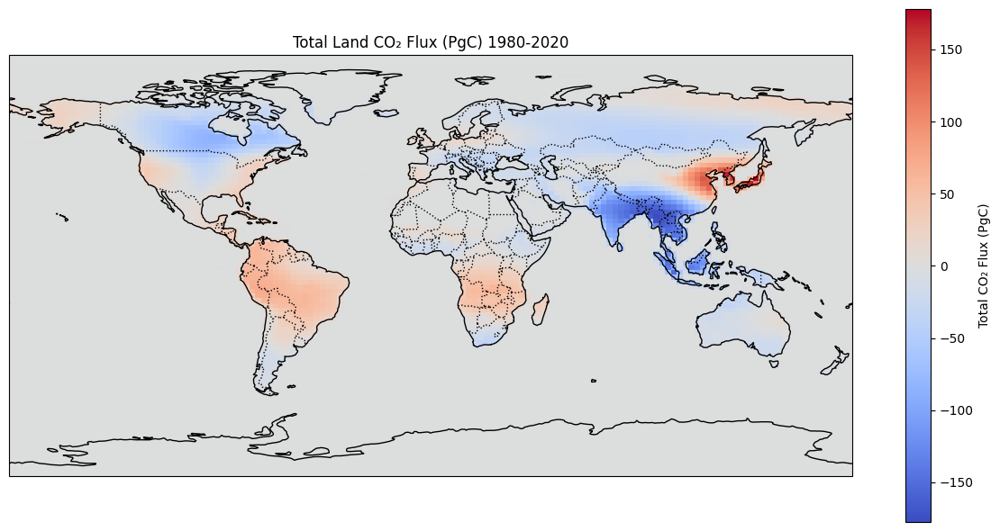

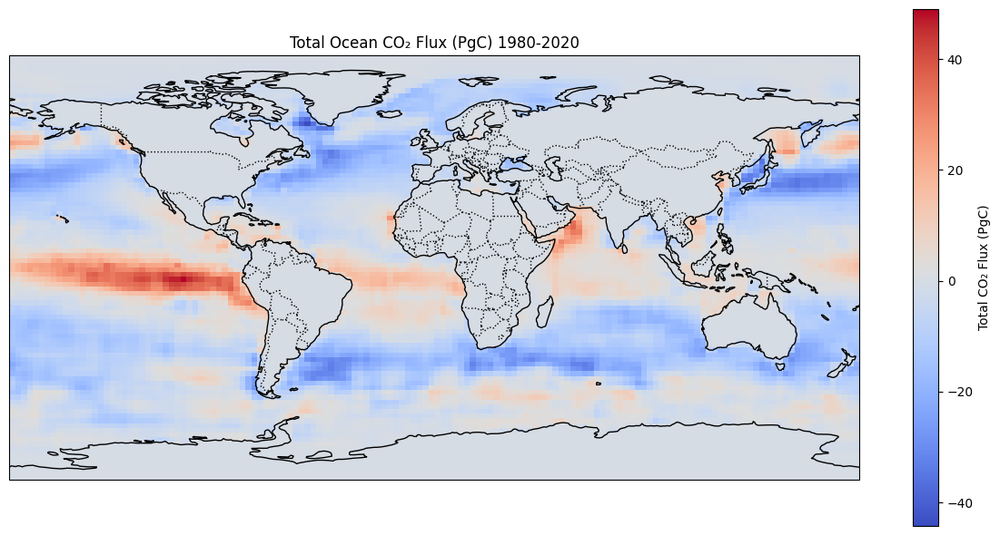

In [ ]:
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Assuming ds is already loaded with the dataset

# Select time range between 1980 and 2020 inclusive
ds_selected = ds.sel(mtime=slice('1980-01-01', '2020-12-31'))

# Sum daily fluxes over the selected time period (mtime dimension)
total_land_flux = ds_selected['co2flux_land'].sum(dim='mtime')
total_ocean_flux = ds_selected['co2flux_ocean'].sum(dim='mtime')

# Coordinates
lat = ds['lat']
lon = ds['lon']

# Plotting function
def plot_flux(data, title, cmap='coolwarm'):
    fig, ax = plt.subplots(figsize=(12, 6), subplot_kw={'projection': ccrs.PlateCarree()})
    c = ax.pcolormesh(lon, lat, data, cmap=cmap, shading='auto', transform=ccrs.PlateCarree())
    ax.coastlines()
    ax.add_feature(cfeature.BORDERS, linestyle=':')
    ax.set_title(title)
    plt.colorbar(c, ax=ax, label='Total CO₂ Flux (PgC)')
    plt.tight_layout()
    plt.show()

# Plot total flux maps for 1980-2020 period
plot_flux(total_land_flux, 'Total Land CO₂ Flux (PgC) 1980-2020')
plot_flux(total_ocean_flux, 'Total Ocean CO₂ Flux (PgC) 1980-2020')


In [ ]:
#Monthly aggregation

import xarray as xr

co2flux_land = ds['co2flux_land']
co2flux_land_global = co2flux_land.sum(dim=['lat', 'lon'])
co2flux_land_monthly = co2flux_land_global.resample(mtime='1MS').sum()

co2flux_ocean = ds['co2flux_ocean']
co2flux_ocean_global = co2flux_ocean.sum(dim=['lat', 'lon'])
co2flux_ocean_monthly = co2flux_ocean_global.resample(mtime='1MS').sum()


(90, 144) (90,) (144,)


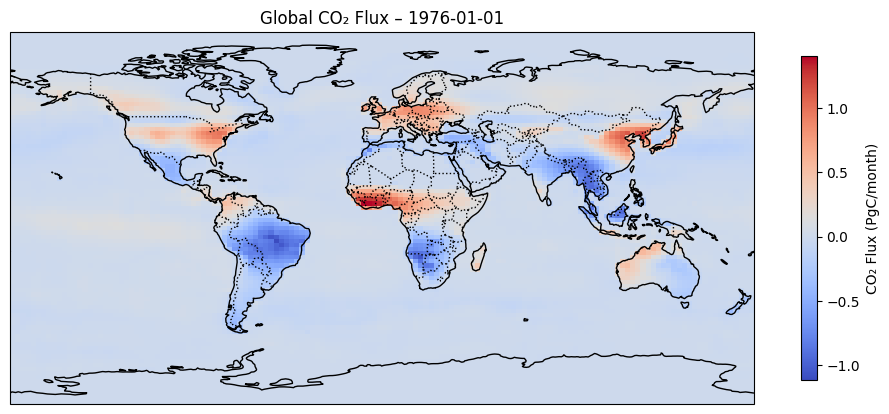

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from IPython.display import HTML


# # Resample to get monthly aggregated fluxes
co2flux_land_monthly = co2flux_land.resample(mtime='1MS').sum()
co2flux_ocean_monthly = co2flux_ocean.resample(mtime='1MS').sum()

# Combine land and ocean fluxes
co2flux_global_monthly = co2flux_land_monthly + co2flux_ocean_monthly

# Get time, lat, lon from dataset
time = co2flux_global_monthly['mtime'].values
lat = ds['lat'].values
lon = ds['lon'].values
# Ensure lon and lat are 2D for pcolormesh
lon2d, lat2d = np.meshgrid(lon, lat)

# Initialize figure and axis
fig, ax = plt.subplots(figsize=(12, 6), subplot_kw={'projection': ccrs.PlateCarree()})

# Add static map features (these are drawn only once)
ax.coastlines()
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.add_feature(cfeature.LAND, facecolor='lightgray')
ax.add_feature(cfeature.OCEAN, facecolor='lightblue')

# Set global extent
ax.set_global()

# Initial frame
initial_frame = co2flux_global_monthly.isel(mtime=0).values
print(initial_frame.shape, lat.shape, lon.shape)

# Plot initial data
mesh = ax.pcolormesh(
    lon2d,
    lat2d,
    initial_frame,
    cmap='coolwarm',
    shading='auto',
    transform=ccrs.PlateCarree()
)

# Add colorbar
cbar = plt.colorbar(mesh, ax=ax, orientation='vertical', shrink=0.7, pad=0.05)
cbar.set_label('CO₂ Flux (PgC/month)')

# Title placeholder
title_text = ax.set_title('', fontsize=12)

# Update function for animation
def drawframe(n):
    frame = co2flux_global_monthly.isel(mtime=n).values
    mesh.set_array(frame.ravel())
    time_str = np.datetime_as_string(time[n], unit='D')
    title_text.set_text(f'Global CO₂ Flux – {time_str}')
    return mesh, title_text

# Create animation
anim = animation.FuncAnimation(
    fig, drawframe,
    frames=len(time),
    interval=300,
    blit=False  # Use blit=False due to map projection complexity
)

# Display animation in notebook
HTML(anim.to_html5_video())


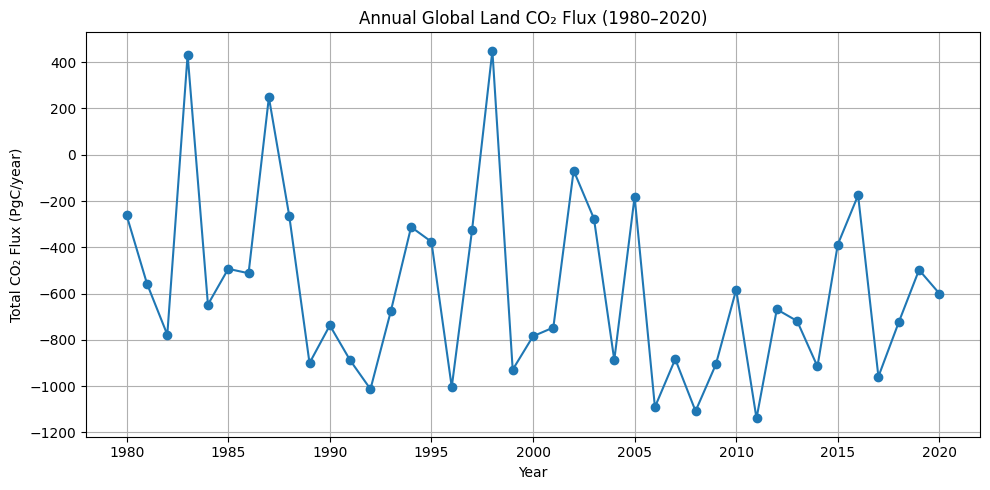

In [ ]:
import xarray as xr
import matplotlib.pyplot as plt

# Step 1: Select the desired period (1980–2020)
ds_selected = ds.sel(mtime=slice('1980-01-01', '2020-12-31'))

# Step 2: Group by year and sum daily values to get annual total flux per grid cell
annual_flux = ds_selected['co2flux_land'].groupby('mtime.year').sum(dim='mtime')

# Step 3: Sum spatially to get global land flux per year (total PgC/year)
# Make sure to weight by area if needed — this assumes raw sum over all grid cells
global_annual_flux = annual_flux.sum(dim=['lat', 'lon'])

# Step 4: Plot time series
plt.figure(figsize=(10, 5))
global_annual_flux.plot(marker='o')
plt.title('Annual Global Land CO₂ Flux (1980–2020)')
plt.ylabel('Total CO₂ Flux (PgC/year)')
plt.xlabel('Year')
plt.grid(True)
plt.tight_layout()
plt.show()


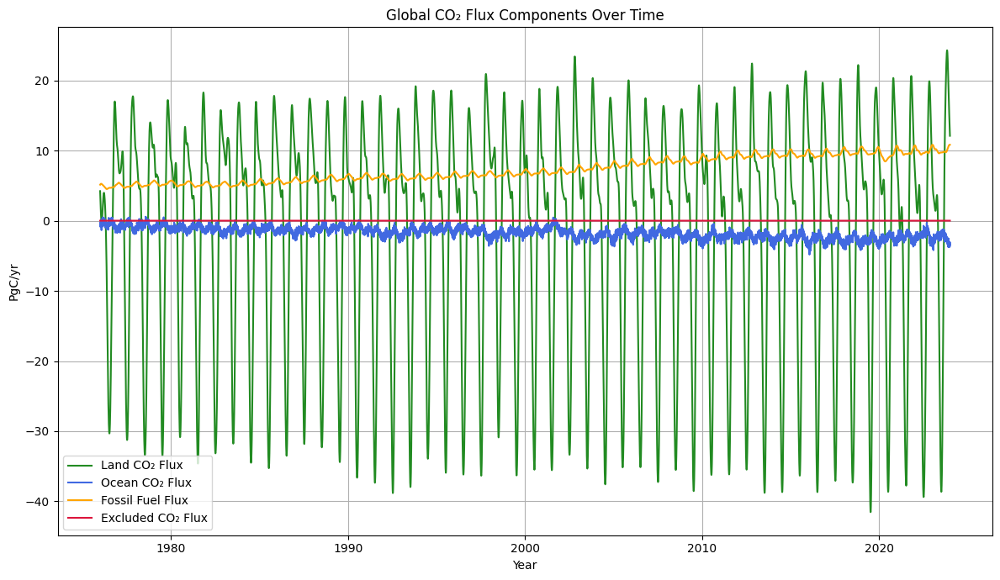

In [ ]:
#Global CO2 Over time
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt


# Load dataset
# ds = xr.open_dataset('your_file.nc')

# Select flux variables
co2flux_land = ds['co2flux_land']
co2flux_ocean = ds['co2flux_ocean']
co2flux_subt = ds['co2flux_subt']
co2flux_excl = ds['co2flux_excl']

# Grid cell area (assuming it's in m²)
area = ds['dxyp']

# Compute global fluxes by multiplying with area and summing over lat & lon
global_land_flux  = (co2flux_land  * area).sum(dim=['lat', 'lon'])
global_ocean_flux = (co2flux_ocean * area).sum(dim=['lat', 'lon'])
global_subt_flux  = (co2flux_subt  * area).sum(dim=['lat', 'lon'])
global_excl_flux  = (co2flux_excl  * area).sum(dim=['lat', 'lon'])


# Compute global fluxes by multiplying with area and summing over lat & lon
# global_land_flux  = (co2flux_land).sum(dim=['lat', 'lon'])
# global_ocean_flux = (co2flux_ocean).sum(dim=['lat', 'lon'])
# global_subt_flux  = (co2flux_subt).sum(dim=['lat', 'lon'])
# global_excl_flux  = (co2flux_excl).sum(dim=['lat', 'lon'])

# Time variable
time = ds['mtime']

# Plot
plt.figure(figsize=(12,7))

plt.plot(time, global_land_flux,  label='Land CO₂ Flux',  color='forestgreen')
plt.plot(time, global_ocean_flux, label='Ocean CO₂ Flux', color='royalblue')
plt.plot(time, global_subt_flux,  label='Fossil Fuel Flux', color='orange')
plt.plot(time, global_excl_flux,  label='Excluded CO₂ Flux', color='crimson')

plt.title('Global CO₂ Flux Components Over Time')
plt.xlabel('Year')
plt.ylabel('PgC/yr')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt

# Load your dataset
# ds = xr.open_dataset('your_file.nc')

# Variables and coordinates
time = ds['mtime'].values
area = ds['area'].isel(rt=0)  # assuming rt=0 for simplicity — adjust if needed

# Get fluxes at each time step (in PgC/yr)
global_land_flux = (ds['co2flux_land'] * area).sum(dim=['lat', 'lon'])
global_ocean_flux = (ds['co2flux_ocean'] * area).sum(dim=['lat', 'lon'])
global_subt_flux = (ds['co2flux_subt'] * area).sum(dim=['lat', 'lon'])
global_excl_flux = (ds['co2flux_excl'] * area).sum(dim=['lat', 'lon'])

# Convert to numpy for plotting
land = global_land_flux.values
ocean = global_ocean_flux.values
subt = global_subt_flux.values
excl = global_excl_flux.values

In [ ]:
# Net flux (sum of all)
net_flux = land + ocean + subt + excl #numpy array
net_flux_darray = global_land_flux + global_ocean_flux + global_subt_flux + global_excl_flux #same value but as a data array
#Moving Average (1 year window)
net_flux_smoothed = net_flux_darray.rolling(mtime=365, center = True).mean()

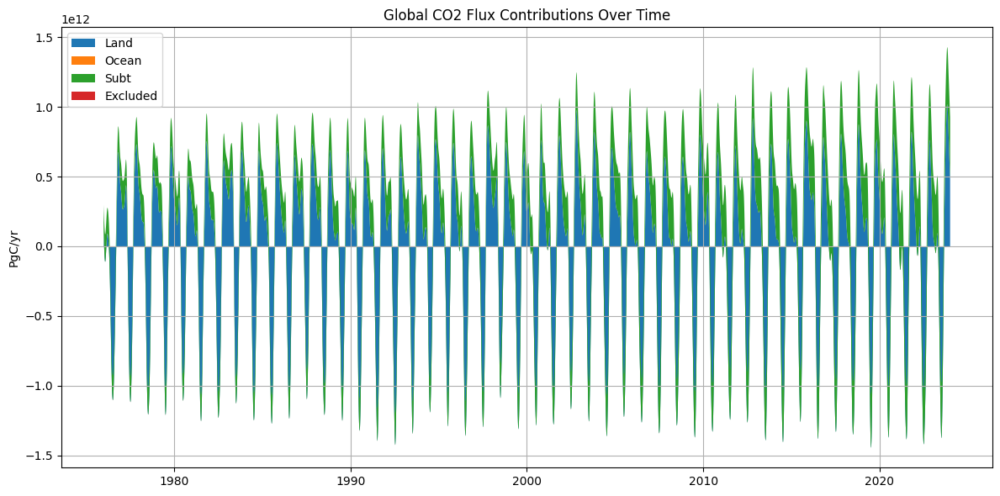

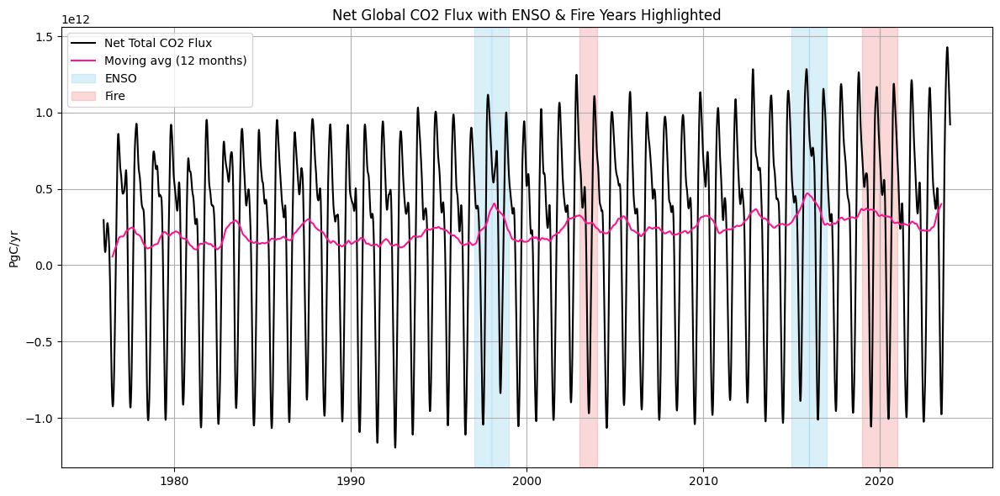

In [ ]:
# 1️⃣ Stacked Area Plot
plt.figure(figsize=(12, 6))
plt.stackplot(time, land, ocean, subt, excl, labels=['Land', 'Ocean', 'Subt', 'Excluded'])
plt.title('Global CO2 Flux Contributions Over Time')
plt.ylabel('PgC/yr')
plt.legend(loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()

# 2️⃣ Net Total Flux Line
# plt.figure(figsize=(12, 6))
# plt.plot(time, net_flux, color='black', label='Net Total CO2 Flux')
# plt.plot(time, net_flux_smoothed, label ='Moving avg (12 months)', color='red')
# plt.title('Net Global CO2 Flux Over Time')
# plt.ylabel('PgC/yr')
# plt.grid(True)
# plt.legend()
# plt.tight_layout()
# plt.show()

# 3️⃣ Net Flux with ENSO & Fire Years Highlighted
enso_years = [1997, 1998, 2015, 2016]  # Example strong ENSO years
fire_years = [2003, 2019, 2020]        # Example major fire years

plt.figure(figsize=(12, 6))
plt.plot(time, net_flux, color='black', label='Net Total CO2 Flux')
plt.plot(time, net_flux_smoothed, label ='Moving avg (12 months)', color='deeppink')

# Shade ENSO years
for y in enso_years:
    plt.axvspan(np.datetime64(f'{y}-01-01'), np.datetime64(f'{y}-12-31'), color='skyblue', alpha=0.3, label='ENSO' if y==enso_years[0] else "")

# Shade Fire years
for y in fire_years:
    plt.axvspan(np.datetime64(f'{y}-01-01'), np.datetime64(f'{y}-12-31'), color='lightcoral', alpha=0.3, label='Fire' if y==fire_years[0] else "")

plt.title('Net Global CO2 Flux with ENSO & Fire Years Highlighted')
plt.ylabel('PgC/yr')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


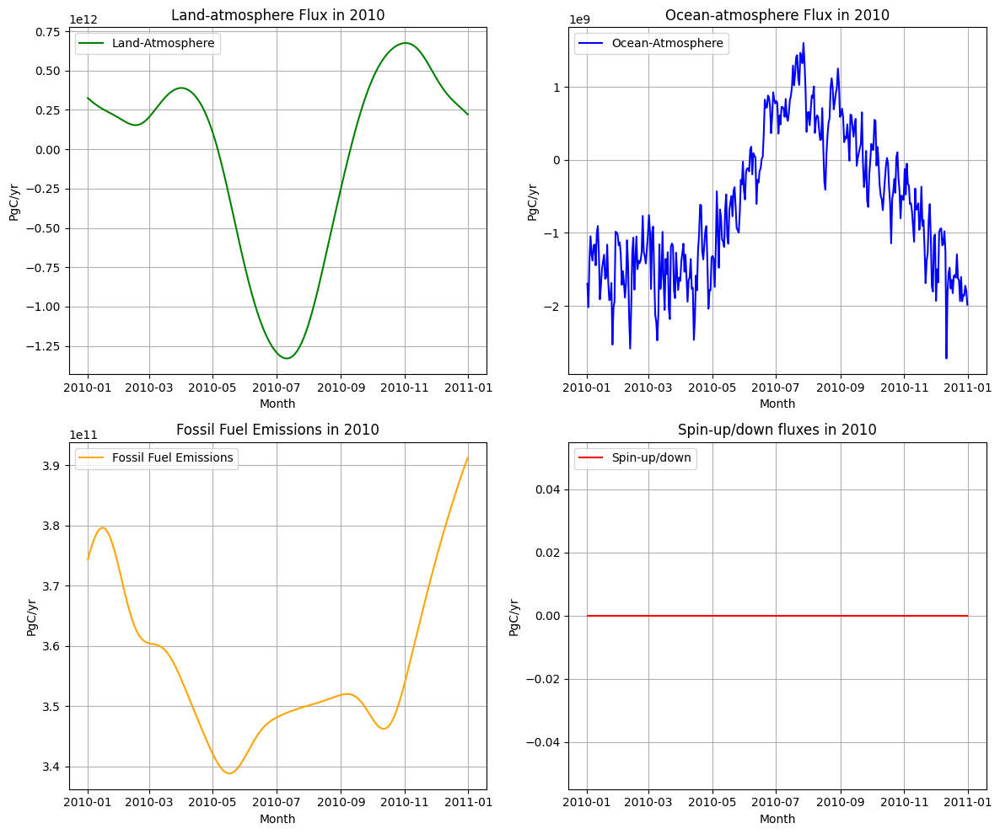

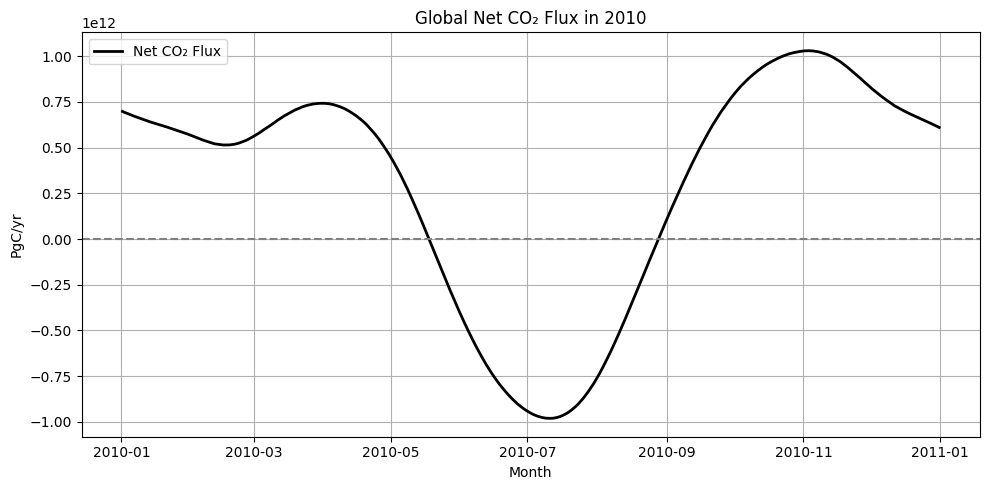

Total global CO2 flux for 2010: 109.4108 PgC
Net fossil fuel flux for 2010: 130.2057 PgC
Net land flux for 2010: -20.5675 PgC


In [ ]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt

# Load your dataset
# ds = xr.open_dataset('your_file.nc')

# Select the year of interest
year_selected = 2010

# Filter data for the selected year (assuming 'mtime' is in datetime format)
mask_2010 = (ds['mtime'].dt.year == year_selected)

# Variables and coordinates
time_2010 = ds['mtime'].sel(mtime=mask_2010).values
area = ds['area'].isel(rt=0)  # assuming rt=0 for simplicity — adjust if needed

# Get fluxes for the selected year (in PgC/yr)
global_land_flux = (ds['co2flux_land'].sel(mtime=mask_2010) * area).sum(dim=['lat', 'lon'])
global_ocean_flux = (ds['co2flux_ocean'].sel(mtime=mask_2010) * area).sum(dim=['lat', 'lon'])
global_subt_flux = (ds['co2flux_subt'].sel(mtime=mask_2010) * area).sum(dim=['lat', 'lon'])
global_excl_flux = (ds['co2flux_excl'].sel(mtime=mask_2010) * area).sum(dim=['lat', 'lon'])

# Convert to numpy for plotting
land = global_land_flux.values
ocean = global_ocean_flux.values
subt = global_subt_flux.values
excl = global_excl_flux.values

# Net flux (sum of all)
net_flux_2010 = land + ocean + subt + excl
net_fossil_flux_2010 = subt.sum()
net_land_flux_2010 = land.sum()
total_flux_2010 = (land + ocean + subt + excl).sum()

# Set up 2x2 subplot grid
fig, axs = plt.subplots(2, 2, figsize=(12, 10))

# Plot each flux on a separate subplot
axs[0, 0].plot(time_2010, land, label='Land-Atmosphere', color='green')
axs[0, 0].set_title('Land-atmosphere Flux in 2010')
axs[0, 0].set_xlabel('Month')
axs[0, 0].set_ylabel('PgC/yr')
axs[0, 0].legend(loc='upper left')
axs[0, 0].grid(True)

axs[0, 1].plot(time_2010, ocean, label='Ocean-Atmosphere', color='blue')
axs[0, 1].set_title('Ocean-atmosphere Flux in 2010')
axs[0, 1].set_xlabel('Month')
axs[0, 1].set_ylabel('PgC/yr')
axs[0, 1].legend(loc='upper left')
axs[0, 1].grid(True)

axs[1, 0].plot(time_2010, subt, label='Fossil Fuel Emissions', color='orange')
axs[1, 0].set_title('Fossil Fuel Emissions in 2010')
axs[1, 0].set_xlabel('Month')
axs[1, 0].set_ylabel('PgC/yr')
axs[1, 0].legend(loc='upper left')
axs[1, 0].grid(True)

axs[1, 1].plot(time_2010, excl, label='Spin-up/down', color='red')
axs[1, 1].set_title('Spin-up/down fluxes in 2010')
axs[1, 1].set_xlabel('Month')
axs[1, 1].set_ylabel('PgC/yr')
axs[1, 1].legend(loc='upper left')
axs[1, 1].grid(True)

# Adjust layout to prevent overlap
fig.tight_layout()

# Show the plot
plt.show()

# Plot Net Flux Time Series
plt.figure(figsize=(10, 5))
plt.plot(time_2010, net_flux_2010, label='Net CO₂ Flux', color='black', linewidth=2)
plt.axhline(0, color='gray', linestyle='--')
plt.title('Global Net CO₂ Flux in 2010')
plt.xlabel('Month')
plt.ylabel('PgC/yr')
plt.legend()
plt.grid(True)
plt.tight_layout()

# Show the Net Flux plot
plt.show()

# Print computed values
print(f"Total global CO2 flux for {year_selected}: {total_flux_2010 * 1e-12:.4f} PgC")
print(f"Net fossil fuel flux for {year_selected}: {net_fossil_flux_2010 * 1e-12:.4f} PgC")
print(f"Net land flux for {year_selected}: {net_land_flux_2010 * 1e-12:.4f} PgC")

In [ ]:
# Constants for conversion
mass_of_atmosphere = 5.135e18  # kg
carbon_to_co2_ratio = 3.67     # CO2:Carbon ratio based on molecular weight

# Convert flux from PgC to ppm CO2
def convert_to_ppm(total_flux_PgC):
    return (total_flux_PgC * carbon_to_co2_ratio) / mass_of_atmosphere * 1e6  # multiply by 1e6 to convert from kg to ppm
# Convert totals from PgC to ppm
total_flux_ppm = convert_to_ppm(total_flux_2010)
fossil_flux_ppm = convert_to_ppm(net_fossil_flux_2010)
land_flux_ppm = convert_to_ppm(net_land_flux_2010)

# Print the results
print(f"Total global CO2 flux for {year_selected}: {total_flux_2010:.4f} PgC ({total_flux_ppm:.4f} ppm)")
print(f"Net fossil fuel flux for {year_selected}: {net_fossil_flux_2010:.4f} PgC ({fossil_flux_ppm:.4f} ppm)")
print(f"Net land flux (incl. spin-up/down) for {year_selected}: {net_land_flux_2010:.4f} PgC ({land_flux_ppm:.4f} ppm)")

Total global CO2 flux for 2010: 109410777038848.0000 PgC (78.1962 ppm)
Net fossil fuel flux for 2010: 130205691674624.0000 PgC (93.0584 ppm)
Net land flux (incl. spin-up/down) for 2010: -20567459627008.0000 PgC (-14.6996 ppm)


In [ ]:
#Code for debugging
# Time array (aligned with DataArray)
time = ds['mtime'].values

# Convert smoothed data to numpy array after smoothing, for plotting
net_flux_smoothed_values = net_flux_smoothed.values

print(time.shape)
print(net_flux_darray.shape)
print(net_flux_smoothed_values.shape)

(17532,)
(17532,)
(17532,)


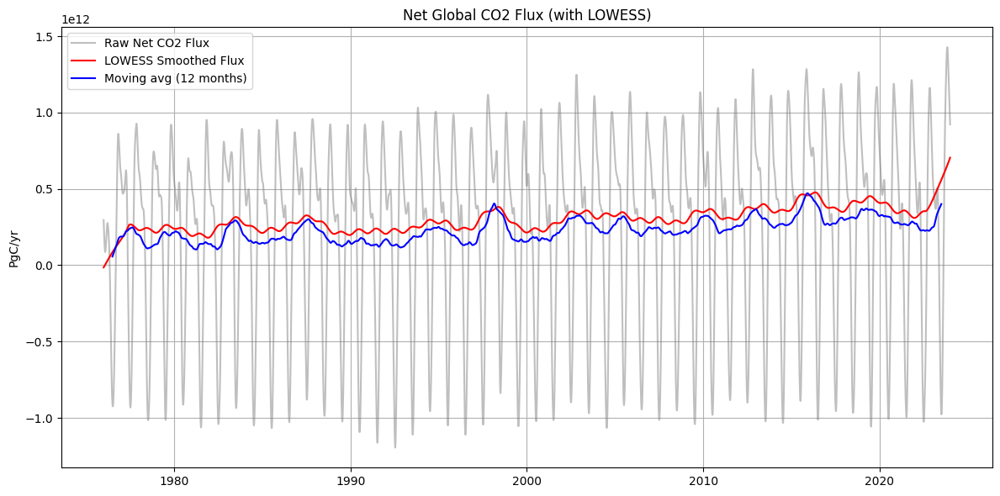

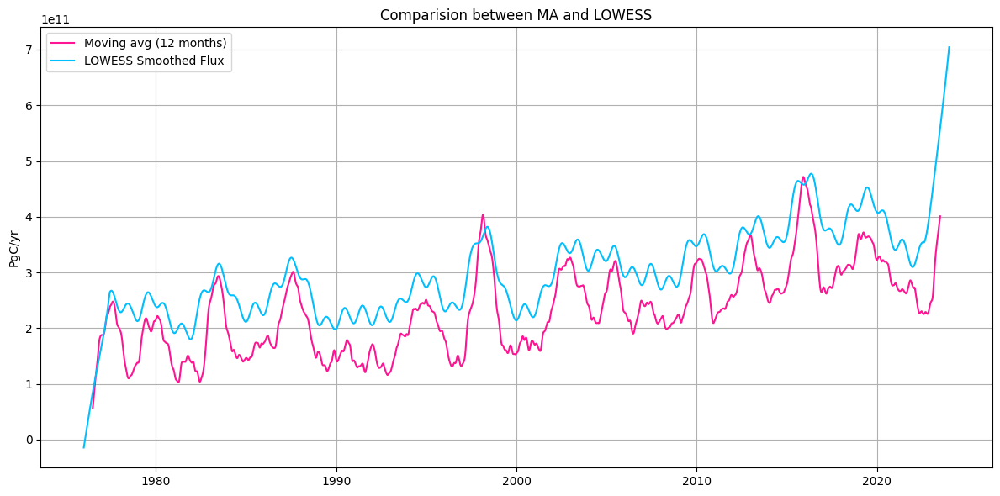

In [ ]:
#LOWESS smoothing
from statsmodels.nonparametric.smoothers_lowess import lowess

#(re)define the net_flux to avoid buggs from previous cells
# net_flux = (ds['co2flux_land'] + ds['co2flux_ocean'] + ds['co2flux_subt'] + ds['co2flux_excl']).sum(dim=['lat', 'lon'])

lowess_smoothed = lowess(net_flux, np.arange(len(net_flux)), frac=0.06)

# Extract smoothed values
smoothed_flux = lowess_smoothed[:, 1]

# Plot original + smoothed
plt.figure(figsize=(12, 6))
plt.plot(time, net_flux, color='gray', alpha=0.5, label='Raw Net CO2 Flux')
plt.plot(time, smoothed_flux, color='red', label='LOWESS Smoothed Flux')
plt.plot(time, net_flux_smoothed, label ='Moving avg (12 months)', color='blue')
plt.title('Net Global CO2 Flux (with LOWESS)')
plt.ylabel('PgC/yr')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

# Compare Moving Avg to Lowess
plt.figure(figsize=(12, 6))
plt.plot(time, net_flux_smoothed, label ='Moving avg (12 months)', color='deeppink')
plt.plot(time, smoothed_flux, color='deepskyblue', label='LOWESS Smoothed Flux')


plt.title('Comparision between MA and LOWESS')
plt.ylabel('PgC/yr')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

In [ ]:
!pip install statsmodels


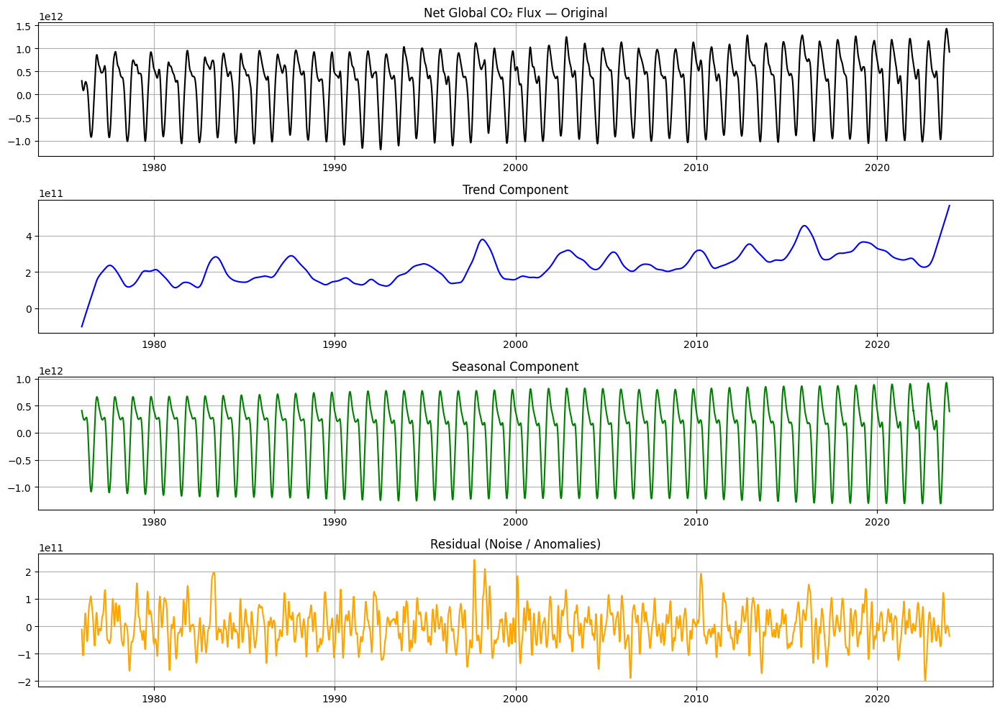

In [ ]:
from statsmodels.tsa.seasonal import STL

stl = STL(net_flux, period=365, seasonal=13)
result = stl.fit()

trend = result.trend
seasonal = result.seasonal
residual = result.resid

# Plot components
plt.figure(figsize=(14, 10))

plt.subplot(4, 1, 1)
plt.plot(time, net_flux, label='Original', color='black')
plt.title('Net Global CO₂ Flux — Original')
plt.grid(True)

plt.subplot(4, 1, 2)
plt.plot(time, trend, label='Trend', color='blue')
plt.title('Trend Component')
plt.grid(True)

plt.subplot(4, 1, 3)
plt.plot(time, seasonal, label='Seasonality', color='green')
plt.title('Seasonal Component')
plt.grid(True)

plt.subplot(4, 1, 4)
plt.plot(time, residual, label='Residual', color='orange')
plt.title('Residual (Noise / Anomalies)')
plt.grid(True)

plt.tight_layout()
plt.show()

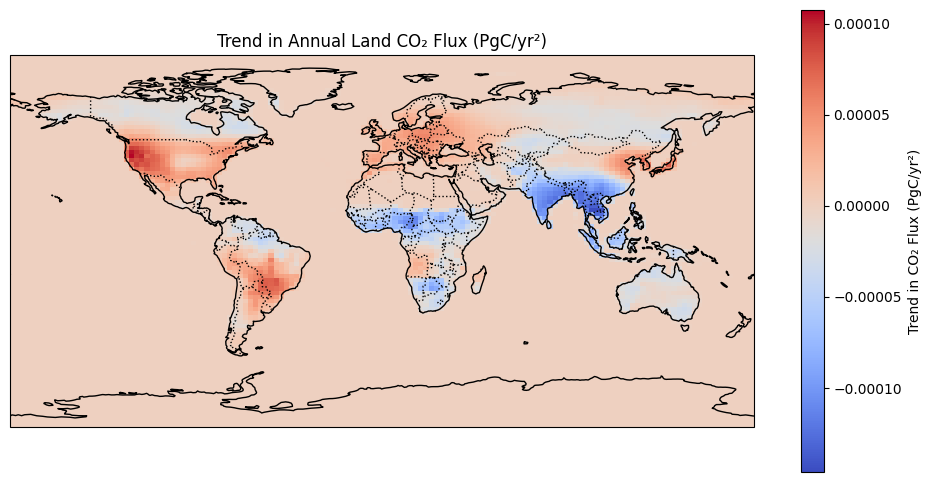

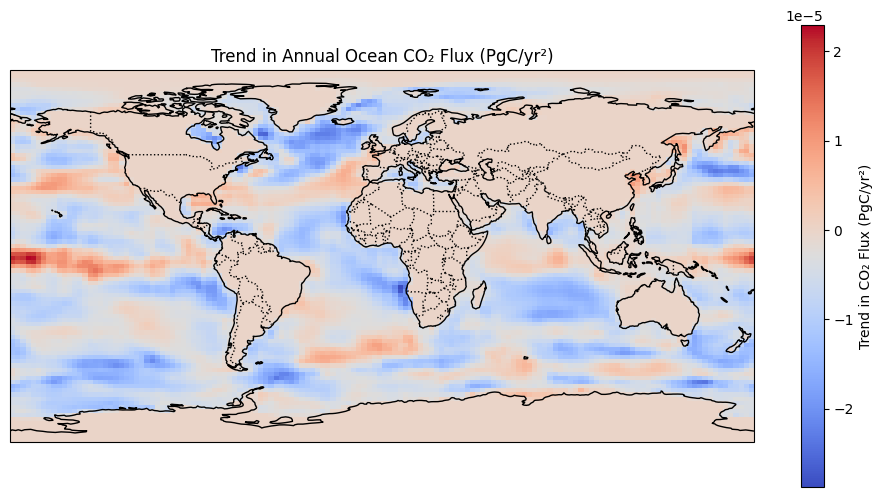

In [ ]:
#Trend maps
#Calculated over the entire time period

import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Assume ds is already loaded and variables are defined
co2flux_land = ds['co2flux_land']
co2flux_ocean = ds['co2flux_ocean']

# Time coordinate (ensure it's numeric)
time_numeric = xr.DataArray(
    np.arange(co2flux_land.sizes['mtime']),
    dims='mtime',
    coords={'mtime': co2flux_land['mtime']}
)

# Fit a linear trend (degree=1) over 'mtime'
trend_result = co2flux_land.polyfit(dim='mtime', deg=1)
trend_result_ocean = co2flux_ocean.polyfit(dim='mtime', deg=1)

# Extract the slope (coefficient of the linear term)
slope = trend_result['polyfit_coefficients'].sel(degree=1)

# Coordinates
lat = ds['lat']
lon = ds['lon']

# Plot
fig, ax = plt.subplots(figsize=(12, 6), subplot_kw={'projection': ccrs.PlateCarree()})

# Use diverging colormap to highlight positive/negative trends
c = ax.pcolormesh(lon, lat, slope, cmap='coolwarm', transform=ccrs.PlateCarree())

ax.coastlines()
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.set_title('Trend in Land CO₂ Flux (PgC/yr²)')

plt.colorbar(c, ax=ax, label='Trend (PgC/yr²)')
plt.show()

########################
# Extract the slope (coefficient of the linear term)
slope = trend_result_ocean['polyfit_coefficients'].sel(degree=1)

# Plot ocean
fig, ax = plt.subplots(figsize=(12, 6), subplot_kw={'projection': ccrs.PlateCarree()})

# Use diverging colormap to highlight positive/negative trends
c = ax.pcolormesh(lon, lat, slope, cmap='coolwarm', transform=ccrs.PlateCarree())

ax.coastlines()
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.set_title('Trend in Land CO₂ Flux (PgC/yr)')

plt.colorbar(c, ax=ax, label='Trend (PgC/yr)')
plt.show()



In [ ]:
!pip install regionmask

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.3/72.3 kB 1.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 18.8 MB/s eta 0:00:00


In [ ]:
#Regional Analysis using TransCom mask yay!
import xarray as xr
import regionmask

# Load your data
ds = xr.open_dataset('/content/drive/MyDrive/r76nbetEXToc_v2024E.flux.nc')
lat = ds['lat']
lon = ds['lon']

# Get TransCom land regions
#transcom = regionmask.defined_regions.ar6.land #AR6 highly defined regions
transcom = regionmask.defined_regions.giorgi

# Create a mask that matches your grid
mask = transcom.mask(lon, lat)

print(mask)
print(np.unique(mask))

for i, name in enumerate(transcom.names):
    print(f"{i}: {name}")


<xarray.DataArray 'mask' (lat: 90, lon: 144)> Size: 104kB
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
  * lat      (lat) float32 360B -89.0 -87.0 -85.0 -83.0 ... 83.0 85.0 87.0 89.0
  * lon      (lon) float32 576B -178.8 -176.2 -173.8 ... 173.8 176.2 178.8
Attributes:
    standard_name:  region
    flag_values:    [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19...
    flag_meanings:  AUS AMZ SSA CAM WNA CNA ENA ALA GRL MED NEU WAF EAF SAF S...
[ 1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11. 12. 13. 14. 15. 16. 17. 18.
 19. 20. 21. nan]
0: Australia
1: Amazon Basin
2: Southern South America
3: Central America
4: Western North America
5: Central North America
6: Eastern North America
7: Alaska
8: Greenland
9: Mediterranean Basin
10: Northe

<ipython-input-28-35d456af32b2>:6: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  ds = xr.open_dataset('/content/drive/MyDrive/r76nbetEXToc_v2024E.flux.nc')


🌎 Climate Zone	📦 Regions
**Tropical**	1: Amazon Basin, 3: Central America, 11: W Africa, 12: E Africa, 15: SE Asia
**Temperate**	0: Australia, 2: Southern South America, 4: Western NA, 5: Central NA, 6: Eastern NA, 9: Mediterranean, 10: Northern Europe, 16: East Asia, 17: South Asia
**Boreal / Cold**	7: Alaska, 8: Greenland, 18: Central Asia, 20: North Asia
**Arid / Desert**	14: Sahara, 19: Tibet
**Mixed**	13: Southern Africa (has both temperate & arid parts)

In [ ]:
#Mapping

ecological_map = {
    "Rainforests": [1, 15, 11],
    "Temperate Forests": [4, 5, 6, 16, 10],
    "Drylands / Deserts": [0, 14, 19],
    "Boreal / Tundra": [7, 8, 20],
    "Mixed / Mosaic": [2, 3, 9, 12, 13, 17, 18]
}

#Apply mask initialised above
mask = transcom.mask(ds)

# Initialize a dictionary to store time series
regional_timeseries = {}

# Loop through each group to calculate regional aggregates
for group_name, region_indices in ecological_map.items():
    # Create mask for this group: True where the region is part of this group
    group_mask = mask.isin(region_indices)

    # Multiply the flux by the group mask to keep only that region
    flux_group = ds['co2flux_land'].where(group_mask)

    # Area-weighted mean or sum (assuming your data is flux per area unit)
    # For total flux (e.g., PgC/month), sum over lat/lon
    flux_group_agg = flux_group.sum(dim=['lat', 'lon'])

    # Store the timeseries
    regional_timeseries[group_name] = flux_group_agg

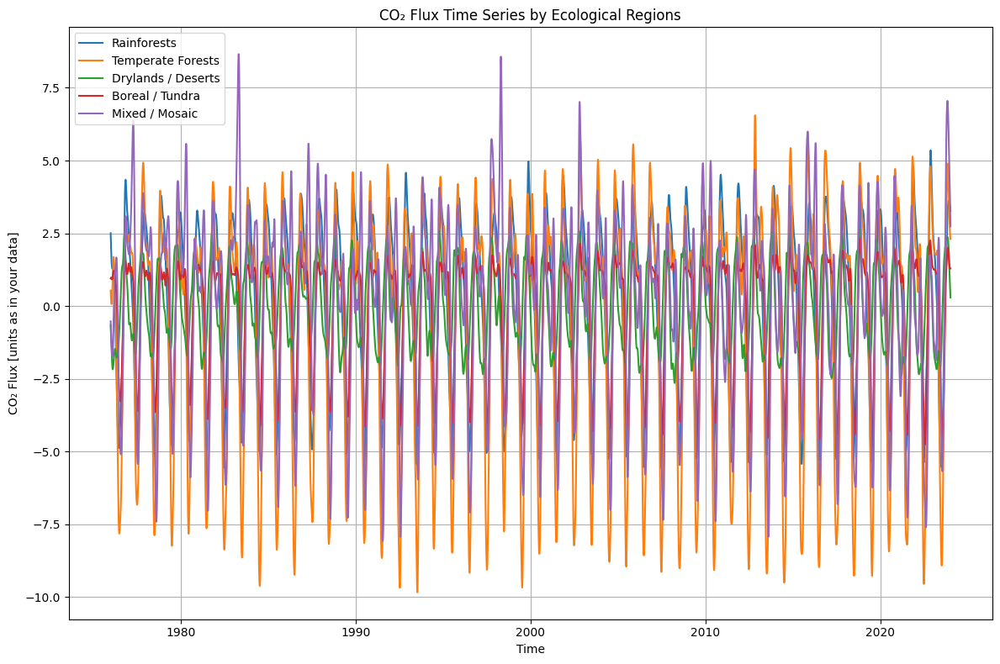

In [ ]:
#All in one plot for comparision

# Plot the time series
plt.figure(figsize=(12, 8))

for group_name, ts in regional_timeseries.items():
    ts.plot(label=group_name)

plt.legend()
plt.title('CO₂ Flux Time Series by Ecological Regions')
plt.ylabel('CO₂ Flux [units as in your data]')
plt.xlabel('Time')
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import STL

# Prepare a dictionary to hold the trend components
regional_trends = {}

# Loop over each region, decompose and extract trend
for group_name, ts in regional_timeseries.items():
    # Drop NaNs (or interpolate if needed)
    ts_clean = ts.dropna('mtime')

    # Convert to pandas Series with DatetimeIndex
    ts_pandas = ts_clean.to_pandas()

    # Perform STL decomposition (period=365, seasonal=13)
    stl = STL(ts_pandas, period=365, seasonal=13)
    result = stl.fit()

    # Extract trend component
    trend = result.trend

    # Store as xarray DataArray for plotting
    trend_da = xr.DataArray(trend, coords={'mtime': ts_clean['mtime']}, dims='mtime')
    regional_trends[group_name] = trend_da

# Plot the trends
plt.figure(figsize=(12, 8))

for group_name, trend_ts in regional_trends.items():
    trend_ts.plot(label=group_name)

plt.legend()
plt.title('CO₂ Flux Trend Components by Ecological Regions (STL: period=365, smoothing window=13)')
plt.ylabel('CO₂ Flux Trend [units as in your data]')
plt.xlabel('Time')
plt.grid(True)
plt.tight_layout()
plt.show()



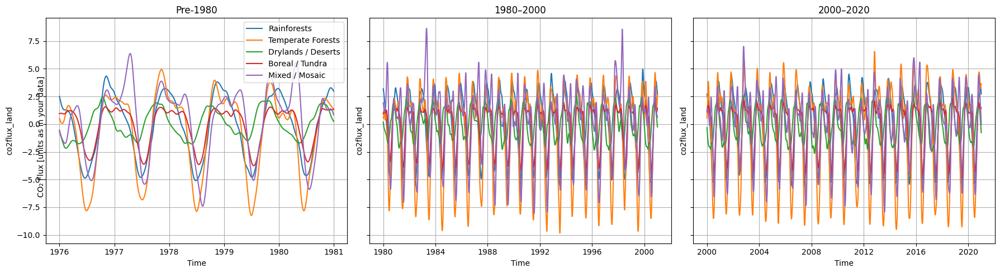

In [ ]:
import matplotlib.pyplot as plt

# Define the time slices
time_slices = {
    'Pre-1980': slice(None, '1980'),
    '1980–2000': slice('1980', '2000'),
    '2000–2020': slice('2000', '2020')
}

# Set up the figure with 3 subplots
fig, axs = plt.subplots(1, 3, figsize=(18, 5), sharey=True)

for ax, (label, time_range) in zip(axs, time_slices.items()):
    for group_name, ts in regional_timeseries.items():
        ts.sel(mtime=time_range).plot(ax=ax, label=group_name)
    ax.set_title(f'{label}')
    ax.set_xlabel('Time')
    ax.grid(True)

# Add a common y-label
fig.text(0.04, 0.5, 'CO₂ Flux [units as in your data]', va='center', rotation='vertical')

# Add legend to the first subplot (adjust as needed)
axs[0].legend()

# Adjust layout
plt.tight_layout()
plt.show()


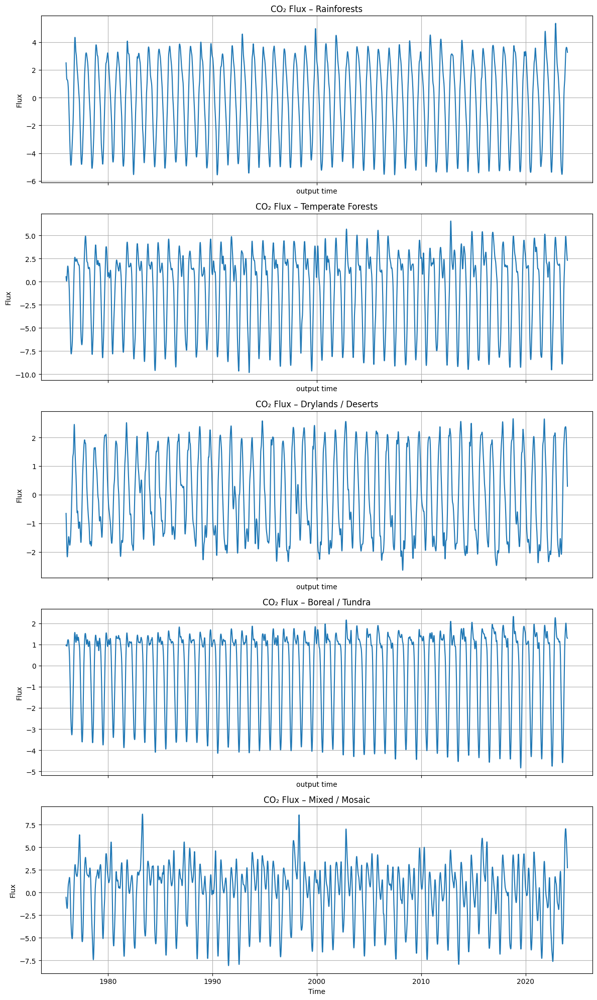

In [ ]:
fig, axs = plt.subplots(5, 1, figsize=(12, 20), sharex=True)

for ax, (group_name, ts) in zip(axs, regional_timeseries.items()):
    ts.plot(ax=ax)
    ax.set_title(f'CO₂ Flux – {group_name}')
    ax.set_ylabel('Flux')
    ax.grid(True)

plt.xlabel('Time')
plt.tight_layout()
plt.show()



/tmp/ipython-input-11-2871534219.py:7: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  ds = xr.open_dataset('/content/drive/MyDrive/r76nbetEXToc_v2024E.flux.nc')


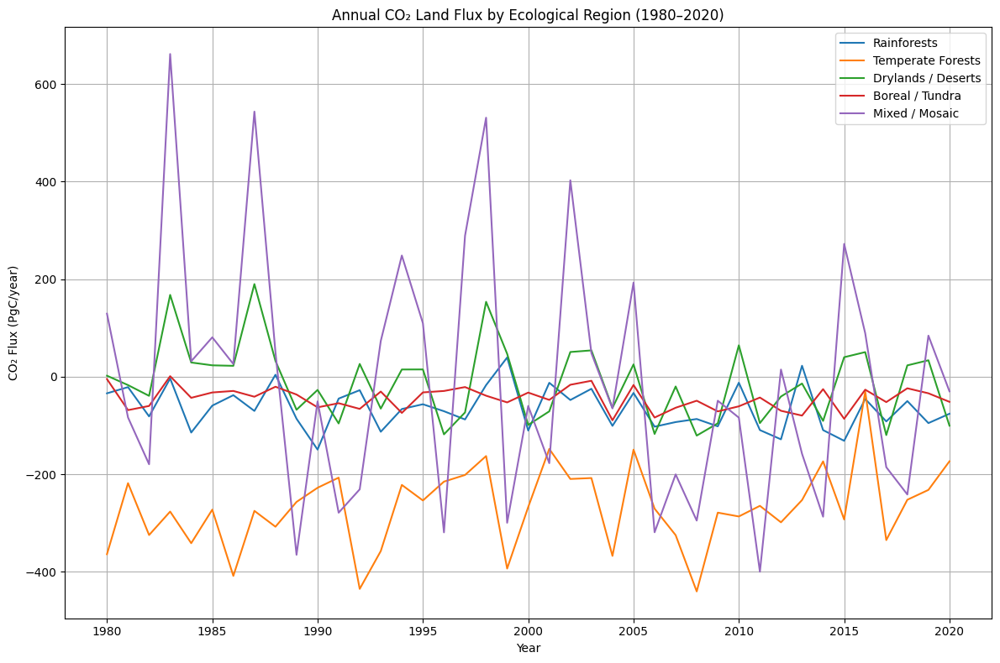

In [ ]:
import xarray as xr
import numpy as np
import regionmask
import matplotlib.pyplot as plt

# Load dataset
ds = xr.open_dataset('/content/drive/MyDrive/r76nbetEXToc_v2024E.flux.nc')

# Slice to desired period
ds = ds.sel(mtime=slice('1980', '2020'))

# Group and sum co2flux_land by year
yearly_flux = ds['co2flux_land'].groupby('mtime.year').sum(dim='mtime')  # (year, lat, lon)

# Apply region mask (Giorgi or TransCom regions)
lat = ds['lat']
lon = ds['lon']
transcom = regionmask.defined_regions.giorgi
mask = transcom.mask(lon, lat)  # shape: (lat, lon)

# Define ecological region groups
ecological_map = {
    "Rainforests": [1, 15, 11],
    "Temperate Forests": [4, 5, 6, 16, 10],
    "Drylands / Deserts": [0, 14, 19],
    "Boreal / Tundra": [7, 8, 20],
    "Mixed / Mosaic": [2, 3, 9, 12, 13, 17, 18]
}

# Prepare time series dict
regional_timeseries = {}

# Loop through each ecological group and aggregate
for group_name, region_indices in ecological_map.items():
    # Boolean mask for group (lat, lon)
    group_mask = mask.isin(region_indices)

    # Broadcast group_mask to (year, lat, lon)
    group_mask_3d = group_mask.broadcast_like(yearly_flux)

    # Mask flux data and sum spatially
    flux_group = yearly_flux.where(group_mask_3d)
    flux_group_agg = flux_group.sum(dim=['lat', 'lon'])

    # Store time series
    regional_timeseries[group_name] = flux_group_agg

# =========================
# Plot: Yearly Flux by Region
# =========================
plt.figure(figsize=(12, 8))

for group_name, ts in regional_timeseries.items():
    ts.plot(label=group_name)

plt.legend()
plt.title('Annual CO₂ Land Flux by Ecological Region (1980–2020)')
plt.ylabel('CO₂ Flux (PgC/year)')
plt.xlabel('Year')
plt.grid(True)
plt.tight_layout()
plt.show()
